In [150]:
# install.packages('ggplot2', repos = "http://cran.us.r-project.org")
# install.packages('scales', repos = "http://cran.us.r-project.org")
# install.packages('lubridate', repos = "http://cran.us.r-project.org")
# install.packages('readr', repos = "http://cran.us.r-project.org")

In [7]:
library(ggplot2)
library(lubridate)
library(readr)
library(scales)
library(reshape2)
library(plyr)


Attaching package: ‘plyr’

The following object is masked from ‘package:lubridate’:

    here



In [164]:
# The competition data is stored in the ../input directory
train <- read.csv("./train.csv")
test  <- read.csv("./test.csv")

apply_transformations <- function (data) {
    # Convert from UTC to EST
    data$est <- as.POSIXct(strftime(ymd_hms(data$datetime), format="%Y-%m-%d %H:%M:%S"), format="%Y-%m-%d %H:%M:%S")
    data$times <- as.POSIXct(strftime(ymd_hms(data$datetime), format="%H:%M:%S"), format="%H:%M:%S")
    data$hour  <- hour(ymd_hms(data$times))
    data$day   <- wday(ymd_hms(data$est), label=TRUE)
    data$date <- as.POSIXct(strftime(ymd_hms(data$datetime), format="%Y-%m-%d"), format="%Y-%m-%d")
    return(data)
}

train <- apply_transformations(train)
test <- apply_transformations(test)

# Tweak these to show something else on the axes
x_axis <- "jitter_times"
y_axis <- "count"
color  <- "temp_f" # for example swap this to "humidity"



#train$jitter_times <- train$times+minutes(round(runif(nrow(train),min=0,max=59)))

In [167]:
head(train)
head(test)

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count,est,times,hour,day,date
1,2011-01-01 00:00:00,1,0,0,1,9.84,14.395,81,0,3,13,16,2010-12-31 19:00:00,2015-12-07 19:00:00,19,Fri,2010-12-31
2,2011-01-01 01:00:00,1,0,0,1,9.02,13.635,80,0,8,32,40,2010-12-31 20:00:00,2015-12-07 20:00:00,20,Fri,2010-12-31
3,2011-01-01 02:00:00,1,0,0,1,9.02,13.635,80,0,5,27,32,2010-12-31 21:00:00,2015-12-07 21:00:00,21,Fri,2010-12-31
4,2011-01-01 03:00:00,1,0,0,1,9.84,14.395,75,0,3,10,13,2010-12-31 22:00:00,2015-12-07 22:00:00,22,Fri,2010-12-31
5,2011-01-01 04:00:00,1,0,0,1,9.84,14.395,75,0,0,1,1,2010-12-31 23:00:00,2015-12-07 23:00:00,23,Fri,2010-12-31
6,2011-01-01 05:00:00,1,0,0,2,9.84,12.88,75,6.0032,0,1,1,2011-01-01,2015-12-07,0,Sat,2011-01-01


,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,est,times,hour,day,date
1,2011-01-20 00:00:00,1,0,1,1,10.66,11.365,56,26.0027,2011-01-19 19:00:00,2015-12-07 19:00:00,19,Wed,2011-01-19
2,2011-01-20 01:00:00,1,0,1,1,10.66,13.635,56,0,2011-01-19 20:00:00,2015-12-07 20:00:00,20,Wed,2011-01-19
3,2011-01-20 02:00:00,1,0,1,1,10.66,13.635,56,0,2011-01-19 21:00:00,2015-12-07 21:00:00,21,Wed,2011-01-19
4,2011-01-20 03:00:00,1,0,1,1,10.66,12.88,56,11.0014,2011-01-19 22:00:00,2015-12-07 22:00:00,22,Wed,2011-01-19
5,2011-01-20 04:00:00,1,0,1,1,10.66,12.88,56,11.0014,2011-01-19 23:00:00,2015-12-07 23:00:00,23,Wed,2011-01-19
6,2011-01-20 05:00:00,1,0,1,1,9.84,11.365,60,15.0013,2011-01-20,2015-12-07,0,Thurs,2011-01-20


# Outliers & missing data
__Some date-hour combinations are missing values or have too many data points__  
__It looks like train-test data was split in UTC__  

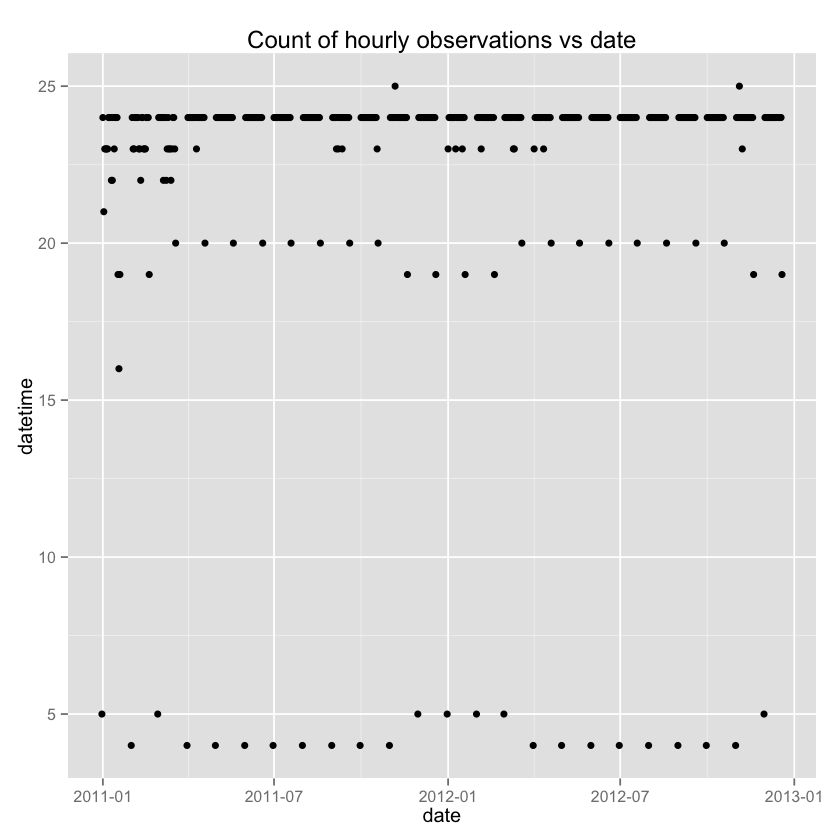

In [172]:
train.count.by.date_hour <- aggregate(datetime ~ date, data=train, FUN=length)
ggplot() +
geom_point(aes(x=date, y=datetime), data=train.count.by.date_hour)+
ggtitle('Count of hourly observations vs date in training data')

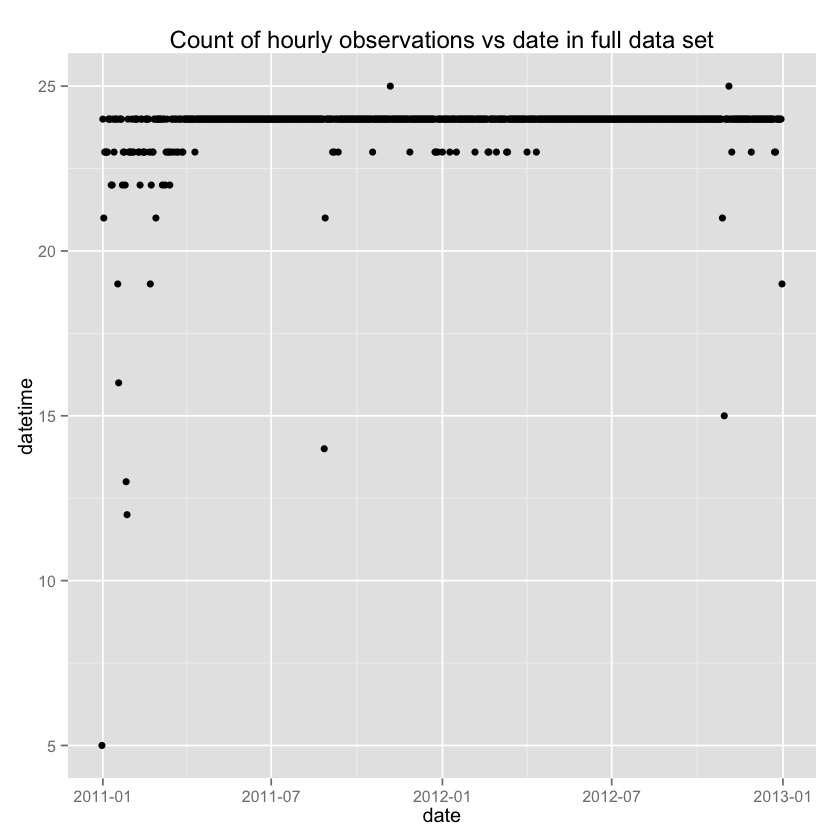

In [185]:
cols <- c('datetime','date')
full.data <- rbind(train[,cols], test[,cols])
full.count.by.date_hour <- aggregate(datetime ~ date, data=full.data, FUN=length)
test.count.by.date_hour <- aggregate(datetime ~ date, data=test, FUN=length)

ggplot() +
geom_point(aes(x=date, y=datetime), data=full.count.by.date_hour)+
#geom_point(aes(x=date, y=datetime), data=test.count.by.date_hour, color='red', size = I(3))+
ggtitle('Count of hourly observations vs date in full data set')

## Plot of total count by date. Dates with missing values in red

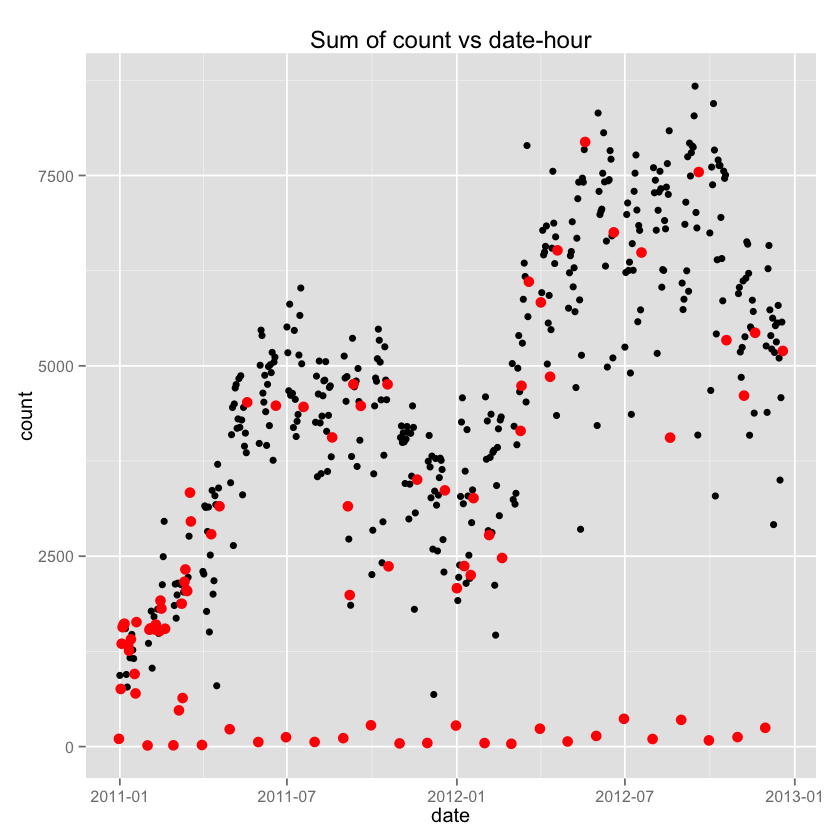

In [160]:
sum.by.date_hour <- aggregate(count ~ date, data=train, FUN=sum)
ggplot() + 
geom_point(data=sum.by.date_hour, aes(x=date, y=count), color='black') + 
geom_point(data=sum.by.date_hour[count.by.date_hour$count < 24,], aes(x=date, y=count), color='red', size = I(3)) +
ggtitle("Sum of count vs date-hour")

In [ ]:
sum.by.date_hour <- aggregate(count ~ date, data=train, FUN=sum)
ggplot() + 
geom_point(data=sum.by.date_hour, aes(x=date, y=count), color='black') + 
geom_point(data=sum.by.date_hour[count.by.date_hour$count < 24,], aes(x=date, y=count), color='red', size = I(3)) +
ggtitle("Sum of count vs date-hour")

In [39]:
# We need to trim the ends so that there's an equal representation of the days of the week
min(train$est)
wday(ymd_hms(min(train$est)), label=TRUE)
max(train$est)
wday(ymd_hms(max(train$est)), label=TRUE)

[1] "2010-12-31 19:00:00 EST"

[1] Fri
Levels: Sun < Mon < Tues < Wed < Thurs < Fri < Sat

[1] "2012-12-19 18:00:00 EST"

[1] Wed
Levels: Sun < Mon < Tues < Wed < Thurs < Fri < Sat

Sun      Mon     Tues      Wed    Thurs      Fri      Sat 
173.7098 190.2356 189.5459 188.3421 199.0271 202.1605 198.1082

0        1 
188.5066 193.0119

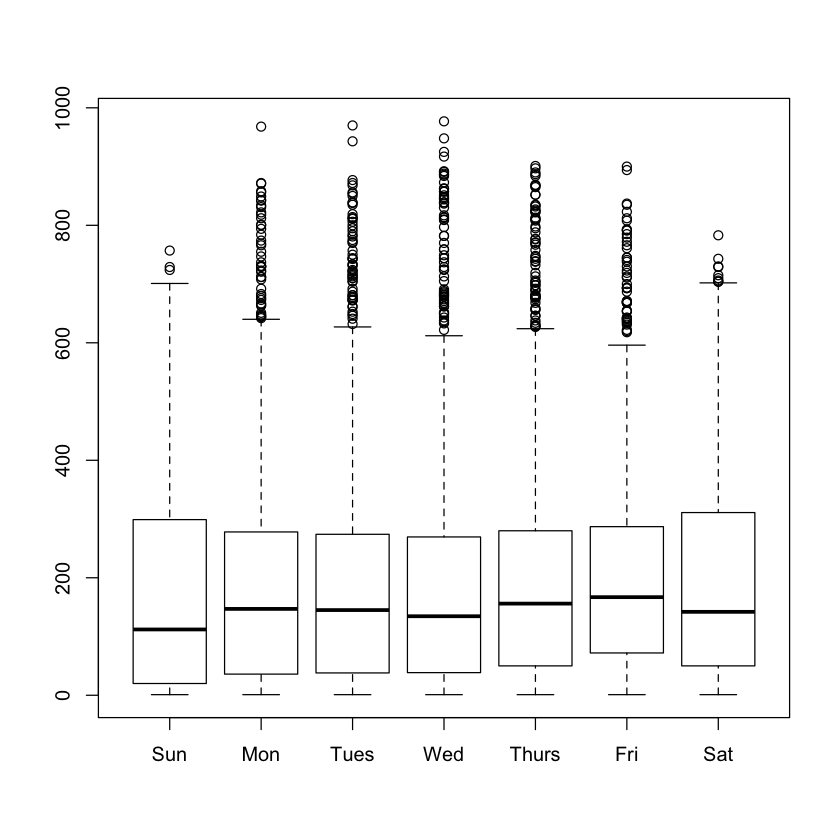

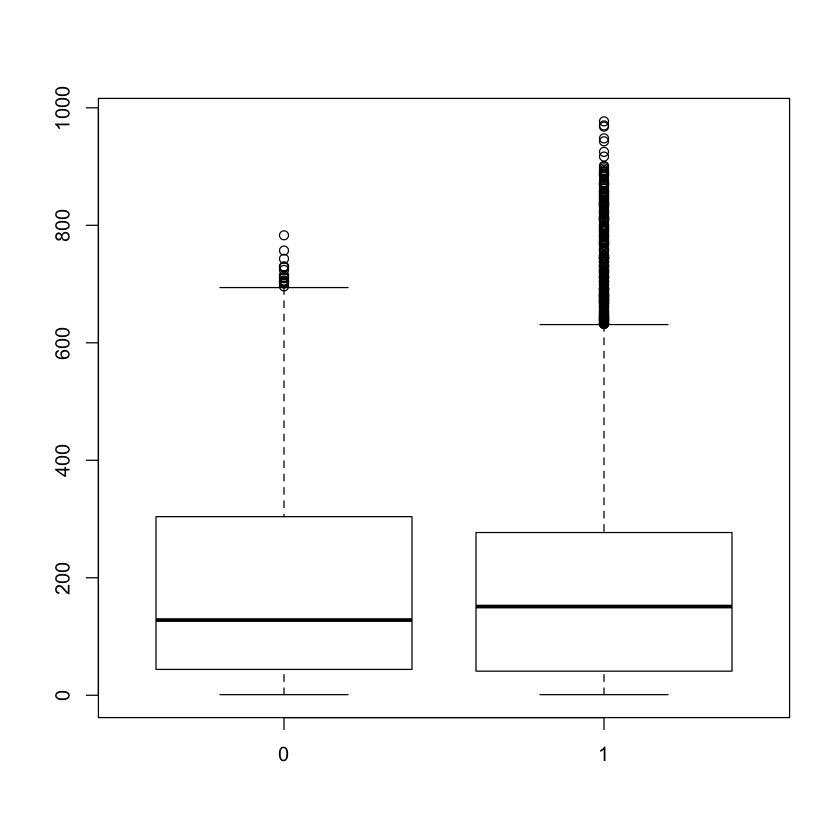

In [75]:
tapply(train$count, train$day, mean)
boxplot(train$count ~ train$day)
tapply(train$count, train$workingday, mean)
boxplot(train$count ~ train$workingday)

In [84]:
anova.data <- ddply(train[train$est >= '2011-01-01' & train$est < '2012-12-15',], c("day", "date"), summarise, count = sum(count))

anova.fit <- aov(count ~ workingday*day*hour, data=train[train$est >= '2011-01-01' & train$est < '2012-12-15',])
summary(anova.fit)

anova.fit
#print(model.tables(anova.fit,"means"),digits=3)
#layout(matrix(c(1,2,3,4),2,2)) # optional layout 
#plot(anova.fit)

                       Df    Sum Sq Mean Sq F value   Pr(>F)    
workingday              1     40858   40858   1.334 0.248033    
day                     6    810778  135130   4.414 0.000183 ***
hour                    1   6754626 6754626 220.617  < 2e-16 ***
workingday:day          5  10377231 2075446  67.787  < 2e-16 ***
workingday:hour         1   1493869 1493869  48.792 3.01e-12 ***
day:hour                6   3221314  536886  17.536  < 2e-16 ***
workingday:day:hour     5   2285937  457187  14.932 1.23e-14 ***
Residuals           10740 328826401   30617                     
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Call:
   aov(formula = count ~ workingday * day * hour, data = train[train$est >= 
    "2011-01-01" & train$est < "2012-12-15", ])

Terms:
                workingday       day      hour workingday:day workingday:hour
Sum of Squares       40858    810778   6754626       10377231         1493869
Deg. of Freedom          1         6         1              5               1
                 day:hour workingday:day:hour Residuals
Sum of Squares    3221314             2285937 328826401
Deg. of Freedom         6                   5     10740

Residual standard error: 174.9771
2 out of 28 effects not estimable
Estimated effects may be unbalanced

In [85]:
pairwise.t.test(anova.data$count, anova.data$day, p.adjust="bonferroni")


	Pairwise comparisons using t tests with pooled SD 

data:  anova.data$count and anova.data$day 

      Sun Mon Tues Wed Thurs Fri
Mon   1   -   -    -   -     -  
Tues  1   1   -    -   -     -  
Wed   1   1   1    -   -     -  
Thurs 1   1   1    1   -     -  
Fri   1   1   1    1   1     -  
Sat   1   1   1    1   1     1  

P value adjustment method: bonferroni 

               Df    Sum Sq Mean Sq F value   Pr(>F)    
day             6    851503  141917   4.326 0.000229 ***
Residuals   10759 352959512   32806                     
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Tables of means
Grand mean
         
191.4749 

 day 
     Sun  Mon Tues  Wed Thurs  Fri  Sat
     174  190  189  187   199  203  198
rep 1544 1521 1522 1533  1549 1540 1557


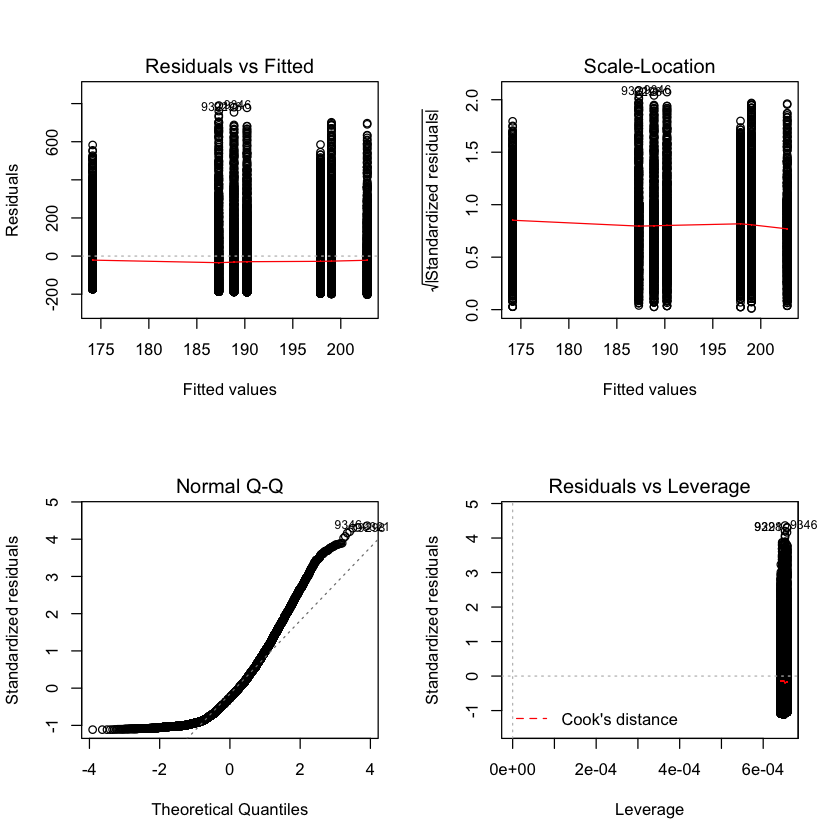

In [65]:
anova.fit <- aov(count ~ day, data=train[train$est >= '2011-01-01' & train$est < '2012-12-15',])
summary(anova.fit)
print(model.tables(anova.fit,"means"),digits=3)
layout(matrix(c(1,2,3,4),2,2)) # optional layout 
plot(anova.fit)

In [ ]:
plot(anova.fit)

geom_smooth: method="auto" and size of largest group is >=1000, so using gam with formula: y ~ s(x, bs = "cs"). Use 'method = x' to change the smoothing method.


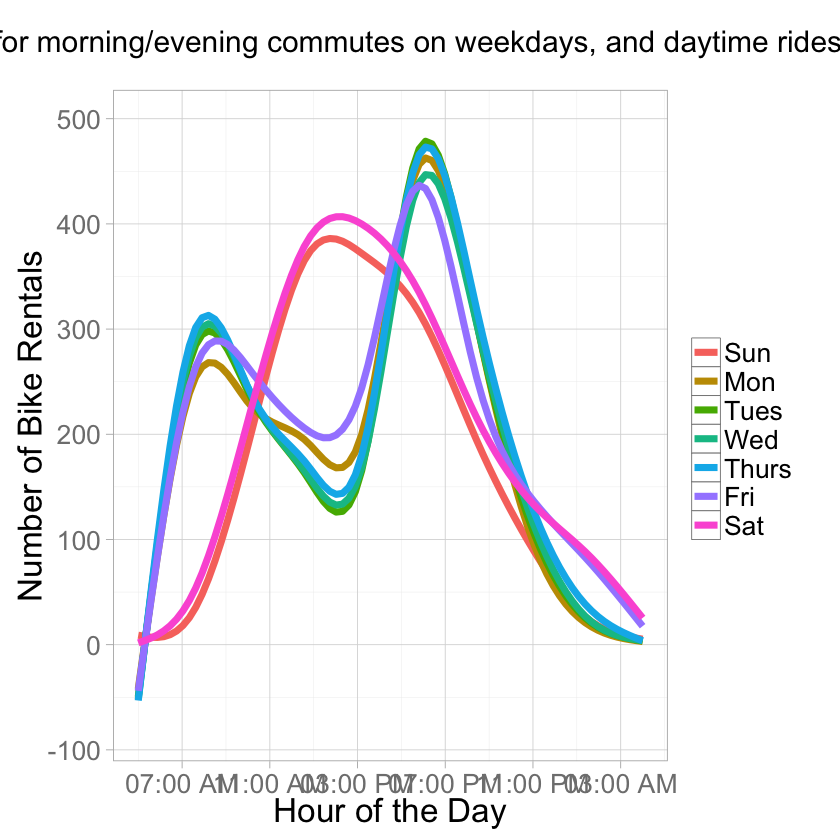

In [77]:
p <- ggplot(train, aes(x=times, y=count, color=day)) +
     geom_smooth(ce=FALSE, fill=NA, size=2) +
     theme_light(base_size=20) +
     xlab("Hour of the Day") +
     scale_x_datetime(breaks = date_breaks("4 hours"), labels=date_format("%I:%M %p")) + 
     ylab("Number of Bike Rentals") +
     scale_color_discrete("") +
     ggtitle("People rent bikes for morning/evening commutes on weekdays, and daytime rides on weekends\n") +
     theme(plot.title=element_text(size=18))
p
#ggsave("bike_rentals_by_time_of_day.png")


geom_smooth: method="auto" and size of largest group is >=1000, so using gam with formula: y ~ s(x, bs = "cs"). Use 'method = x' to change the smoothing method.


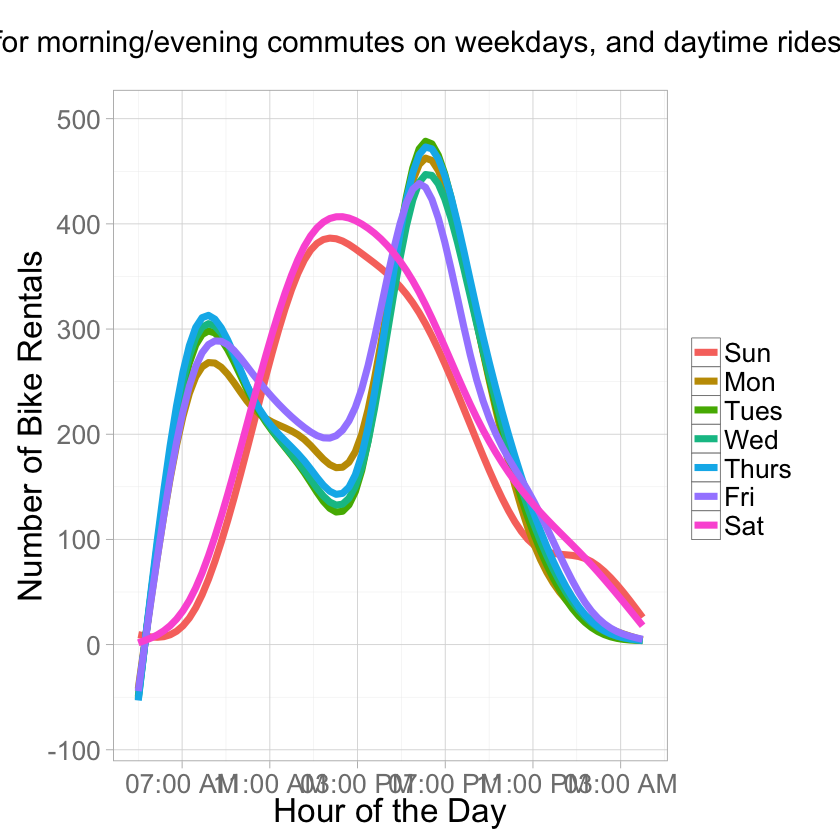

In [71]:
train$hour  <- hour(ymd_hms(train$datetime))
train$times <- as.POSIXct(strftime(ymd_hms(train$datetime), format="%H:%M:%S"), format="%H:%M:%S")
train$day   <- wday(ymd_hms(train$datetime), label=TRUE)

p <- ggplot(train, aes(x=times, y=count, color=day)) +
     geom_smooth(ce=FALSE, fill=NA, size=2) +
     theme_light(base_size=20) +
     xlab("Hour of the Day") +
     scale_x_datetime(breaks = date_breaks("4 hours"), labels=date_format("%I:%M %p")) + 
     ylab("Number of Bike Rentals") +
     scale_color_discrete("") +
     ggtitle("People rent bikes for morning/evening commutes on weekdays, and daytime rides on weekends\n") +
     theme(plot.title=element_text(size=18))
p
#ggsave("bike_rentals_by_time_of_day.png")


Number of training rows  10886 
Number of test rows  6493 


,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count
1,2011-01-01 00:00:00,1,0,0,1,9.84,14.395,81,0,3,13,16
2,2011-01-01 01:00:00,1,0,0,1,9.02,13.635,80,0,8,32,40
3,2011-01-01 02:00:00,1,0,0,1,9.02,13.635,80,0,5,27,32
4,2011-01-01 03:00:00,1,0,0,1,9.84,14.395,75,0,3,10,13
5,2011-01-01 04:00:00,1,0,0,1,9.84,14.395,75,0,0,1,1
6,2011-01-01 05:00:00,1,0,0,2,9.84,12.88,75,6.0032,0,1,1


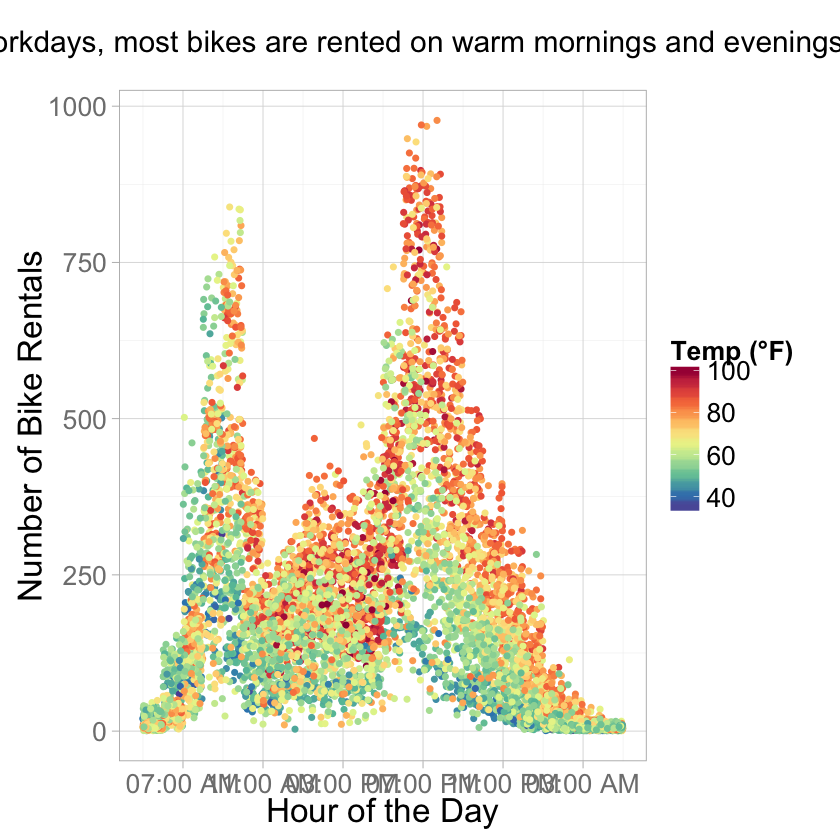

In [7]:
# Write some basic stats to the log
cat("Number of training rows ", nrow(train), "\n")
cat("Number of test rows ", nrow(test), "\n")
head(train)

p <- ggplot(train[train$workingday==1,], aes_string(x=x_axis, y=y_axis)) +
     geom_point(position=position_jitter(w=0.0, h=0.4)) +
     theme_light(base_size=20) +
     xlab("Hour of the Day") +
     scale_x_datetime(breaks = date_breaks("4 hours"), labels=date_format("%I:%M %p")) + 
     ylab("Number of Bike Rentals") +
     scale_colour_gradientn("Temp (°F)", colours=c("#5e4fa2", "#3288bd", "#66c2a5", "#abdda4", "#e6f598", "#fee08b", "#fdae61", "#f46d43", "#d53e4f", "#9e0142")) +
     ggtitle("On workdays, most bikes are rented on warm mornings and evenings\n") +
     theme(plot.title=element_text(size=18))
p
#ggsave("bike_rentals_by_time_and_temperature.png", p)

In [ ]:
p <- ggplot(train, aes_string(x=x_axis, y=y_axis, color=color)) +
     geom_point(position=position_jitter(w=0.0, h=0.4)) +
     theme_light(base_size=20) +
     xlab("Hour of the Day") +
     scale_x_datetime(breaks = date_breaks("4 hours"), labels=date_format("%I:%M %p")) + 
     ylab("Number of Bike Rentals") +
     scale_colour_gradientn("Temp (°F)", colours=c("#5e4fa2", "#3288bd", "#66c2a5", "#abdda4", "#e6f598", "#fee08b", "#fdae61", "#f46d43", "#d53e4f", "#9e0142")) +
     ggtitle("On workdays, most bikes are rented on warm mornings and evenings\n") +
     theme(plot.title=element_text(size=18))
p

[1] "datetime"     "season"       "holiday"      "workingday"   "weather"     
 [6] "temp"         "atemp"        "humidity"     "windspeed"    "casual"      
[11] "registered"   "count"        "hour"         "times"        "jitter_times"
[16] "day"          "temp_f"

# Correlation matrix

ERROR: Error in cor(train[, c(2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13)]): 'x' must be numeric


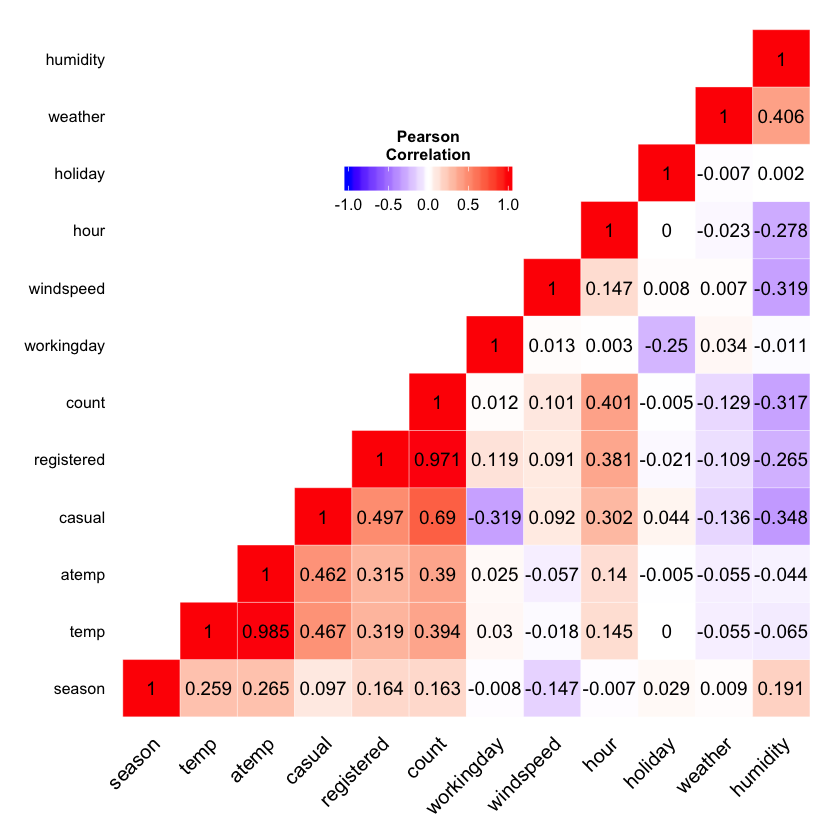

In [60]:
cormat <- round(cor(train[, c(2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13)]), 3)
reorder_cormat <- function(cormat){
# Use correlation between variables as distance
dd <- as.dist((1-cormat)/2)
hc <- hclust(dd)
cormat <-cormat[hc$order, hc$order]
}

cormat <- reorder_cormat(cormat)

get_lower_tri<-function(cormat){
    cormat[upper.tri(cormat)] <- NA
    return(cormat)
  }

  get_upper_tri <- function(cormat){
    cormat[lower.tri(cormat)]<- NA
    return(cormat)
  }

lower_cormat <- get_upper_tri(cormat)
melted_cormat <- melt(lower_cormat, na.rm=TRUE)

ggheatmap <- ggplot(melted_cormat, aes(Var2, Var1, fill = value))+
 geom_tile(color = "white")+
 scale_fill_gradient2(low = "blue", high = "red", mid = "white", 
   midpoint = 0, limit = c(-1,1), space = "Lab", 
    name="Pearson\nCorrelation") +
  theme_minimal()+ # minimal theme
 theme(axis.text.x = element_text(angle = 45, vjust = 1, 
    size = 12, hjust = 1))+
 coord_fixed() + geom_text(aes(Var2, Var1, label = value), color = "black", size = 4) +
theme(
  axis.title.x = element_blank(),
  axis.title.y = element_blank(),
  panel.grid.major = element_blank(),
  panel.border = element_blank(),
  panel.background = element_blank(),
  axis.ticks = element_blank(),
  legend.justification = c(1, 0),
  legend.position = c(0.6, 0.7),
  legend.direction = "horizontal")+
  guides(fill = guide_colorbar(barwidth = 7, barheight = 1,
                title.position = "top", title.hjust = 0.5))
ggheatmap